# Reinforcement Learning Policy Tuning by changing the Reward Function

## Introduction

In this Notebook, I will be using a simple 2D game environment and a Reinforcement Learning agent with different reward functions to evaluate the importance of the reward function to the actions of the agent and to the outcome of the game. The policy of an RL agent is what determines his behaviors. The reward signal, calculated by the reward function, is what determines the policy of an agent.

The game environment used is a simulation of the game "Catch" where fruits fall from the top of the screen and the player has to catch them in his basket. Every time he catches one fruit he is rewarded with 1 point and every time he misses one he gets a negative reward of -1.
In each step of the game, the player can take one of the three following actions, go left, stay in the same place, or go right. These three are going to be the action space from which our agent can choose each step.
For training the agent we are going to use Deep Q-Learning. The Neural Network used in this experiment is a Feed-Forward Network with 2 hidden layers.

The environment used is based on the code of [Eder Santana](https://edersantana.github.io/articles/keras_rl/) for the same game. He created a simple "Catch" environment and also training and testing scripts for the agent. From his post, we can see the agent performing after being trained.
<img src=https://edersantana.github.io/articles/keras_rl/catch.gif alt="Drawing" style="width: 500px;"/>
<figcaption text-align:centre>Fig.1 - Ref.: [Eder Santana] </figcaption>

## The Problem

As we can see from the gif above our agent is able to perform quite well on the specific task after 1000 epochs.
One thing that can be observed, though, is that the agent performs a lot of unnecessary movements. Movements that contribute little to nothing to the final result of the episode. In this particular environment, this might not pose a major problem since moving comes with no cost. There are, of course, other problems where the same principles apply, changing the position of the agent to be in a specific place in time to catch fruits or avoid obstacles, but extra moves are unwanted. For example, when training driving policies of an autonomous vehicle we would prefer to have as little position adjustments as possible to ensure a smooth driving experience while maintaining transportation safety. Therefore, a policy is required that is capable of minimizing the unnecessary movements while sustaining its success rate.


## Hypothesis

The actions of the agent are determined by its policy which is created based on his attempt to gather the highest reward possible. We can assign negative reward (punishment) to actions that are undesirable and thus try to minimize their occurrence while still maintaining or even increasing the winning rate of the agent.

### Reward Functions

For this reason, in addition to the Default function, two new approaches were implemented in the Catch environment for the calculation of the reward value. Those new reward functions assign a negative reward on each action of the agent that changes its location, left or right. Another punishment is added for each movement that leads to a move against the "walls" of the environment. Such a movement occurs for example when the agent is on the rightmost position of the environment and the action he chooses is also to go right, leading him to stay in the same position after he "hits" the wall. Those "undesirable" behaviors are hereby denoted as "extra moves". The two new reward functions differ only in the time step in which they return a "meaningful"* reward value. 

#### I. Default Reward Function

While using the Default Reward Function (1), our agent receives a reward value by the end of the episode.
This reward is a constant value and is determined only by the outcome of the episode. As described above the default approach returns a value of 1 for every successful episode, fruit in the basket, and value of -1 if it was unsuccessful, the fruit gets lost. The reward value for each timestep other than the last of the episode is equal to 0. In this method, we can say that the rewards are sparse. This way we don't penalize extra moves or moves that don't change the location of the agent (against the wall). The agent might understand that those moves offer nothing eventually, but this might take longer training times. 

$$Reward_{default}(t,w)=\begin{cases}\ \,\ 0 & t < last\_step \\ \ \,\ 1 & t = last\_step,\ w= 1\\-1 & t = last\_step,\ w= 0\end{cases}  \quad\big(1\big)$$

Where <b>t</b> denotes the time-step of the episode, <b>w</b> is its outcome and <b>p</b> is the penalty applied to extra moves. In our case:
$$ t \in (0,last\_step]\ ,\quad  w =\begin{cases}0 & unsuccessful\\1 & successful\end{cases}\  ,\quad p = -0.04$$

#### II. Penalized Once Reward Function

In this approach, the mentality remains the same with the default function with the exception that we also apply a penalization to/of extra moves. This leads to rewards that vary depending on the actions taken during the episode. The function returns a value of 0 after each step except from the last one in which the cumulative amount of the punishments corresponding to the extra moves is added to the outcome of the episode (2). As they are only awarded after the episode has finished, the agent has to make the correlation between extra moves and punishments itself without explicitly knowing which action corresponds to which reward. The rewards, here, are still sparse, the same as with the default function.

$$Reward_{penalty\_once}\ (t,w)=\begin{cases}\ \,\ 0 & t < last\_step \\ \ \,\ 1+ExtraMoves*p & t = last\_step,\ w= 1\\-1+ExtraMoves*p & t = last\_step,\ w= 0\end{cases}  \quad\big(2\big)$$

#### III. Penalized Reward Function

Conversely, The Penalized reward function returns at each step a value which is calculated based on the number of extra moves made up to this point and at the last step, the reward of the episode's outcome is added (3). The reward changes every time the agent is performing an extra move. Thus, the agent can assign a reward to each of his actions and in that way, he learns more consistently and in fewer iterations that extra moves yield lower rewards while maintaining the notion that catching the fruit is rewarded highly. 

$$Reward_{penalty}(t,w)=\begin{cases}\ \,\ ExtraMoves(t)*p & t < last\_step \\ \ \,\ 1+ExtraMoves(t)*p & t = last\_step,\ w= 1\\-1+ExtraMoves(t)*p & t = last\_step,\ w= 0\end{cases}  \quad\big(3\big)$$


## Game Modes

To make the game more interesting and more challenging for our agent, the code of the game was enhanced three new game modes. Now we can choose between four different game modes that affect the way the fruit is "falling". The different possible options are:
1. Straight Free Fall (default) - The fruit is falling down in a straight line.
2. Diagonal Fall - The fruit makes two moves per step, one down and one left or right.  
3. Diagonal Slow Fall - The fruit makes one move per step, once down and once to the side, left or right. 
4. Random Fall - The fruit next move is randomly picked from the sets [0,1] (stay, move down) for the Y-axis and [-1,0,1] (left, stay, right) for the X-axis. This game mode makes the environment Non-Deterministic. 

---
\* Here, "meaningful" is used to differentiate the non-zero rewards from the zero rewards which are returned after each time-step in both the Default and the Penalized Once reward functions.

In [1]:
import presentation
import matplotlib.pyplot as plt
from IPython.display import HTML
%matplotlib inline

train_results = presentation.load_results(folder='train')
test_results = presentation.load_results(folder='test')
video_dict = presentation.load_jshtml(presentation.path)

# Results
The results of the training and testing process of the experiment are displayed below in 2 groups with 6 sets of graphs each. The first group displays the results of training while the second the results from testing. 


The 4 first sets of each group compare the different reward functions on the different game_modes. Each one of the four sets comprises of the following 2 graphs:
1. Win Rate - The success rate of each agent
2. Extra Moves per Steps - The number of undesirable behaviors performed by the agent per number of steps. 

A more extensive set of 6 (7 in case of 'random' game_mode) graphs is available if we run ```plot_graphs(results, game_mode, extensive=True)```
1. Wins - The number of successful episodes of each agent
2. Win Rate - The success rate of each agent
3. Moves - The number of Left or Right actions of each agent
4. Wall Hits - The number of Against-the-Wall actions of each agent
5. Moves per Steps - The number of Left or Right actions performed by the agent per number of steps.
6. Wall Hits pes Steps - The number of Against-the-Wall actions performed by the agent per number of steps.
7. Steps per Epoch - The number of environment steps from beginning to end. Meaningful only if game_mode == 'random', otherwise a straight line.

The "per Steps" graphs can also be seen as the possibility of performing an extra move during a step.

The 5th set of graphs shows how many times each agent choose a particular action, also in training. 

The 6th is used to observe the most frequent action at each time-step.

Finally, 4 animations are available to better visualize the different behaviors of the agent with each policy.


## Training Results

The agents were trained for 2000 epochs (episodes). 

The exploration parameter ε started with an initial value of 1 (explore at each step) and it was discounted at each episode by an exponential decay rate of 0.01. This decrease continued until the ε reached its minimum value of 0.1.

The training took about 5 hours in an 8 core CPU with 16GB available.
Although one might be more interested in how the agent is behaving after it was completely trained, it is quite important to take a look also on what happened during training. The results below offer quite an insight into the inner workings of the training process. Especially, the graphs showing the "Moves per Step" and "Wall hits per Step" where we can see if the agent made the correlation of Extra Moves, low rewards and how they are decreased.

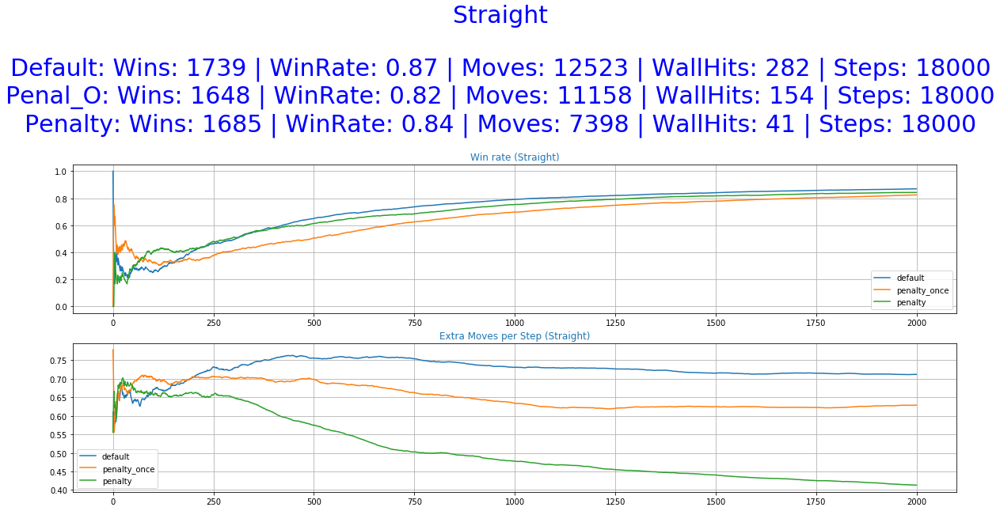

In [2]:
presentation.plot_graphs(train_results, 'straight')

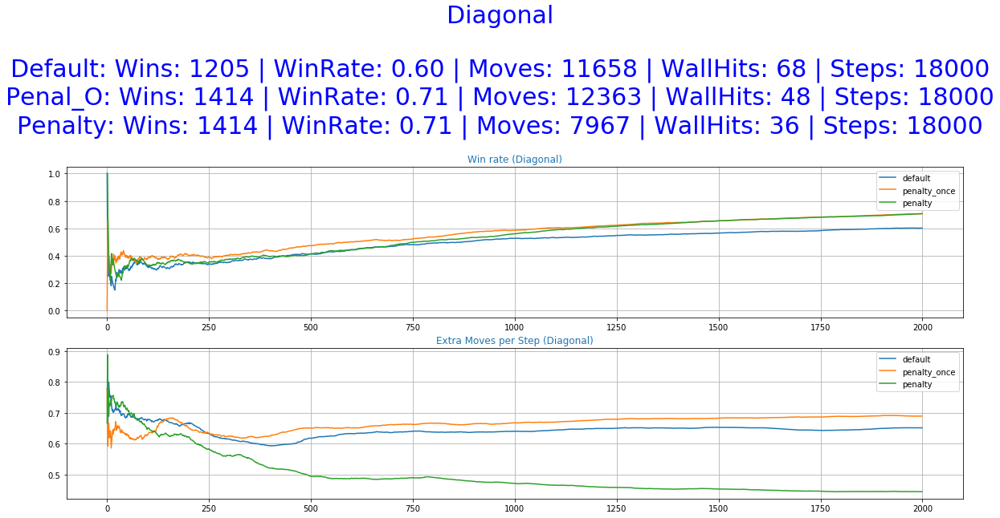

In [3]:
presentation.plot_graphs(train_results, 'diagonal')

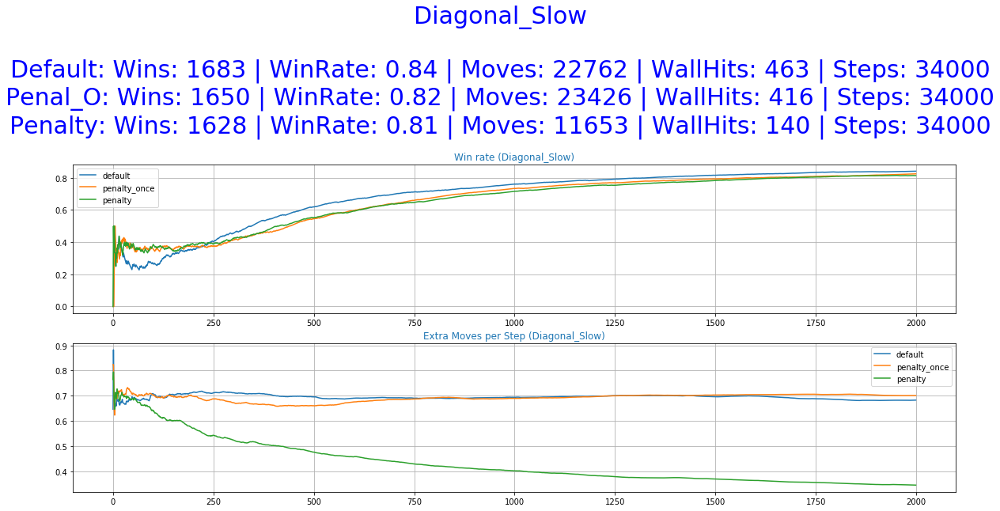

In [4]:
presentation.plot_graphs(train_results, 'diagonal_slow')

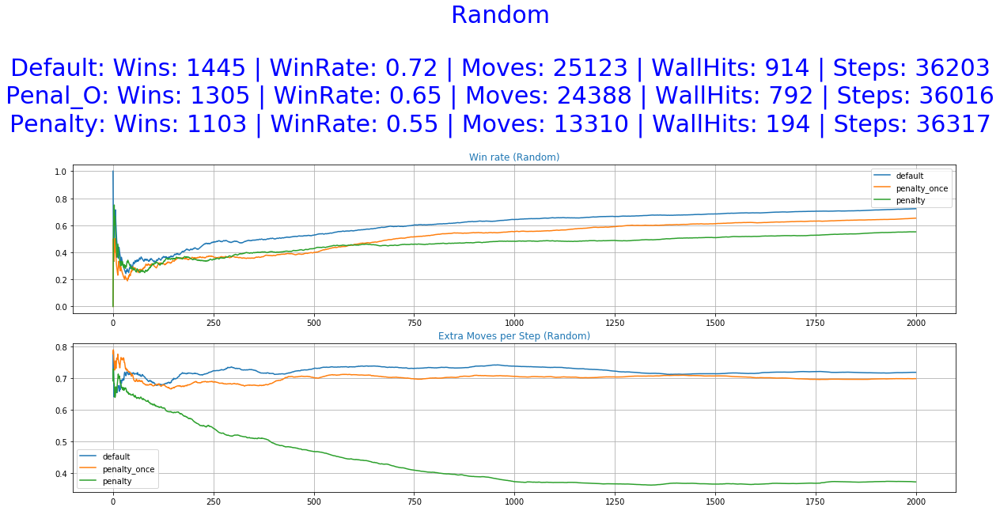

In [5]:
presentation.plot_graphs(train_results, 'random')

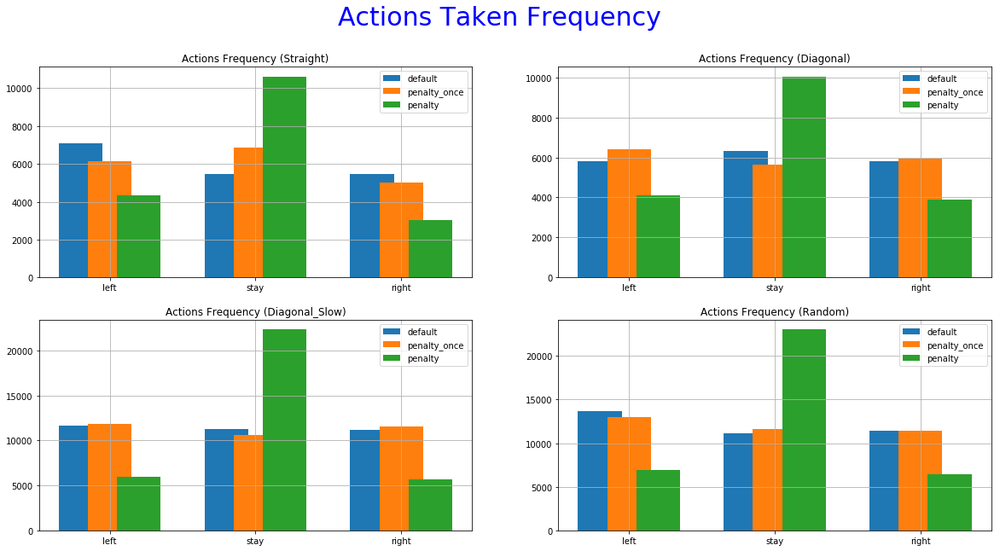

In [6]:
presentation.plot_actions_bar(train_results)

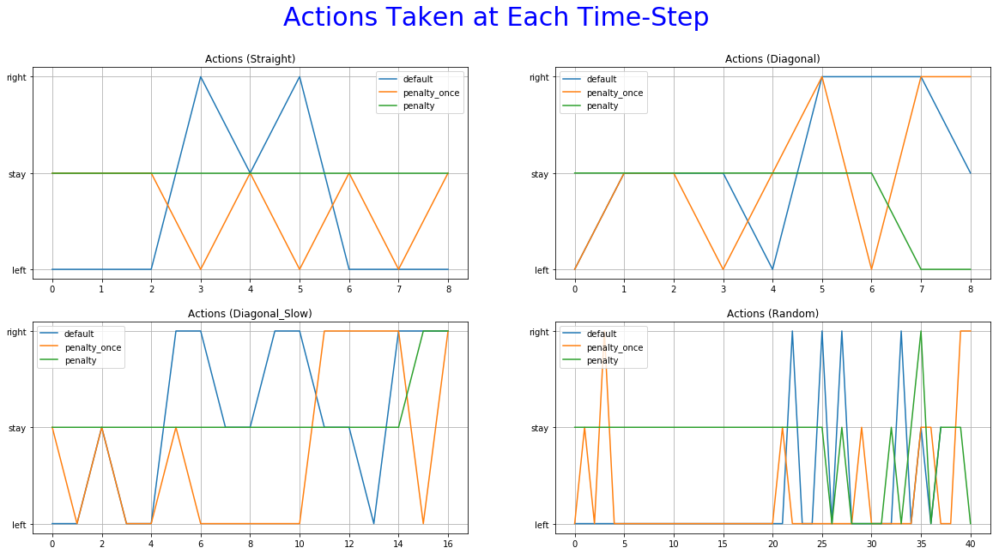

In [7]:
presentation.plot_actions_mod(train_results)

We can observe from the graphs of training how the occurrence of extra moves is slowly declining indicating that the agent is learning.

# Test Results
The agents were tested for 50 episodes each. The results are displayed below following the same logic as before.

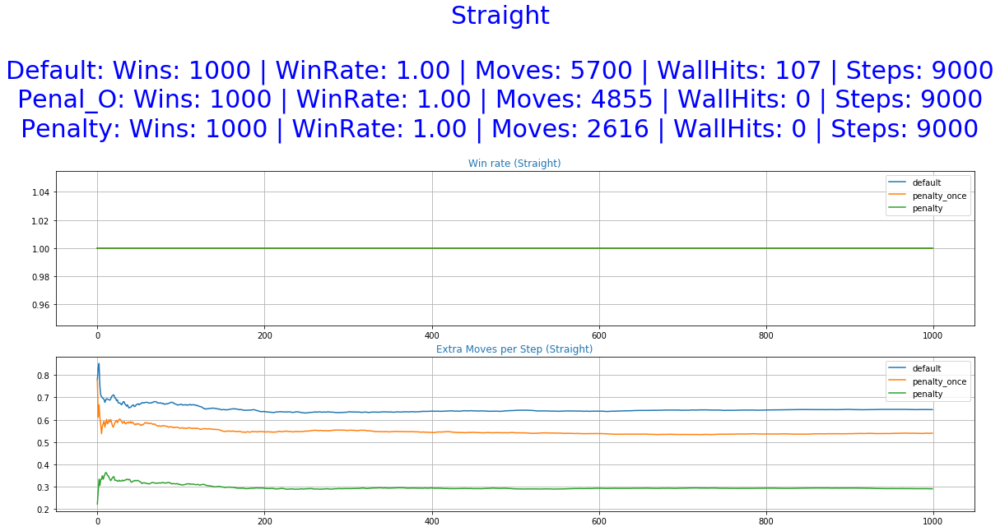

In [8]:
presentation.plot_graphs(test_results, 'straight')

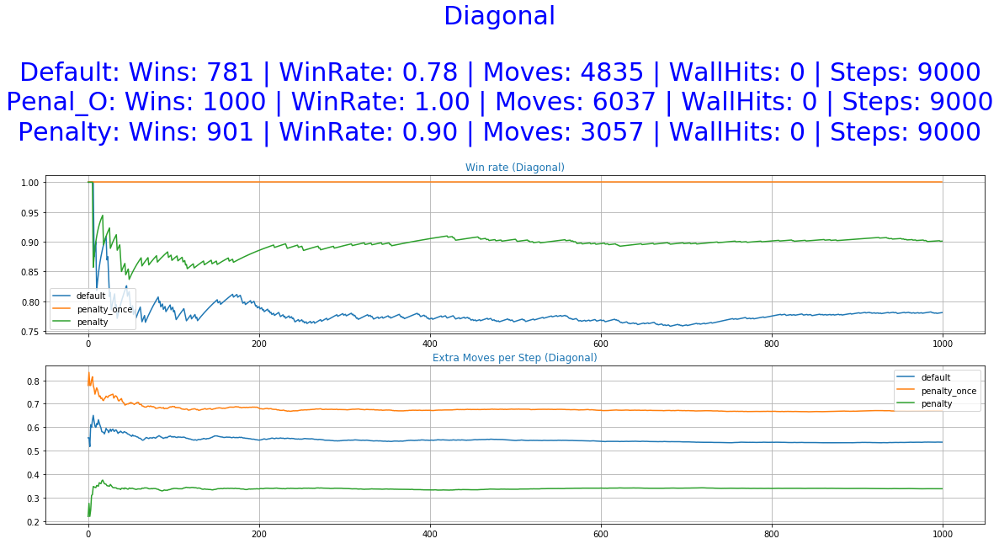

In [9]:
presentation.plot_graphs(test_results, 'diagonal')

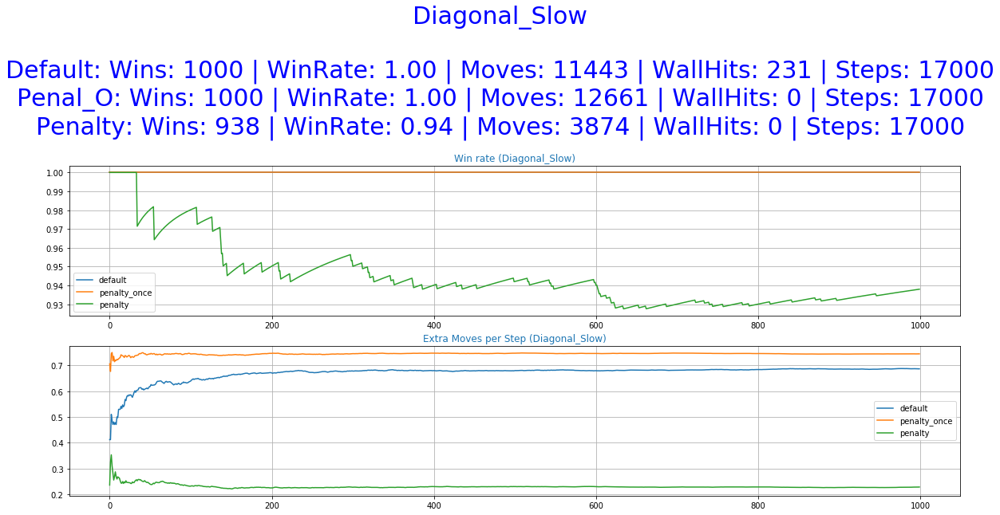

In [10]:
presentation.plot_graphs(test_results, 'diagonal_slow')

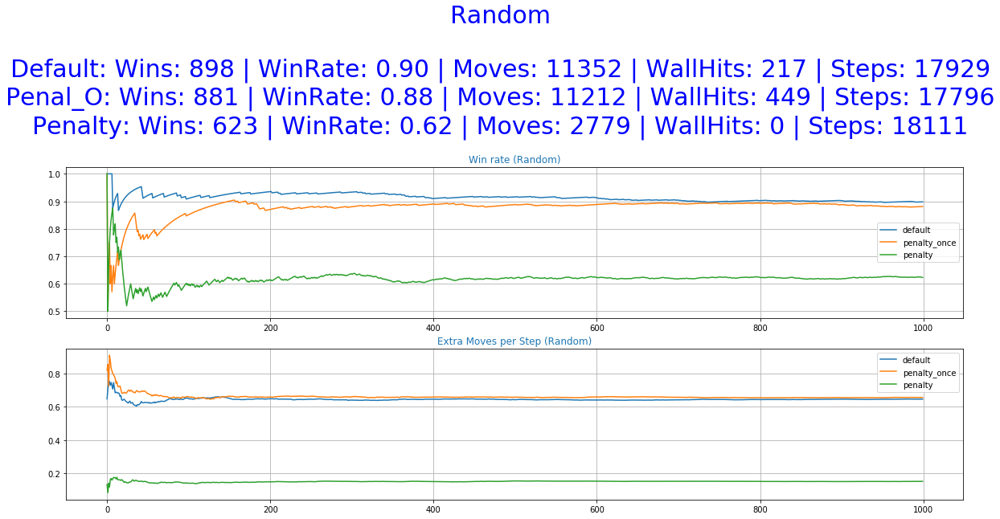

In [11]:
presentation.plot_graphs(test_results, 'random')

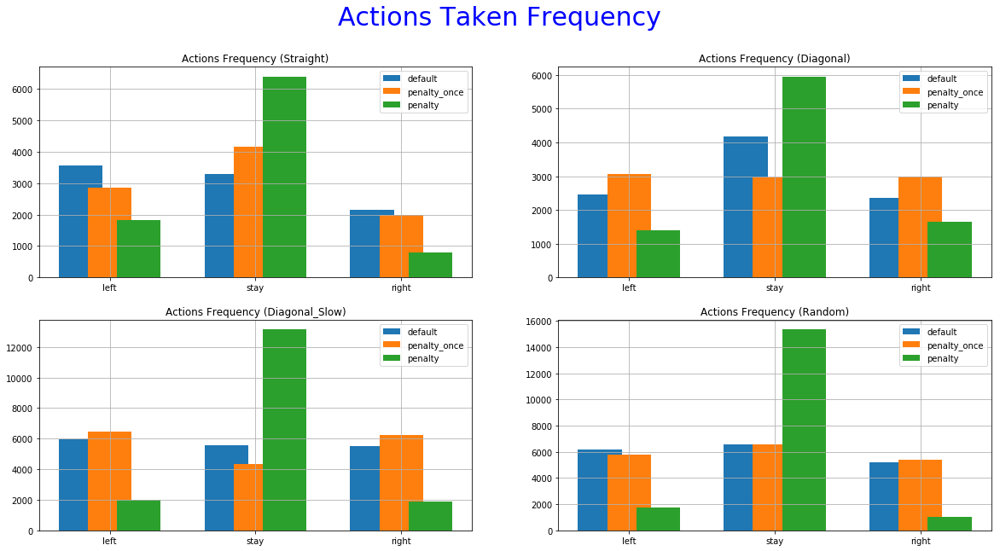

In [12]:
presentation.plot_actions_bar(test_results)

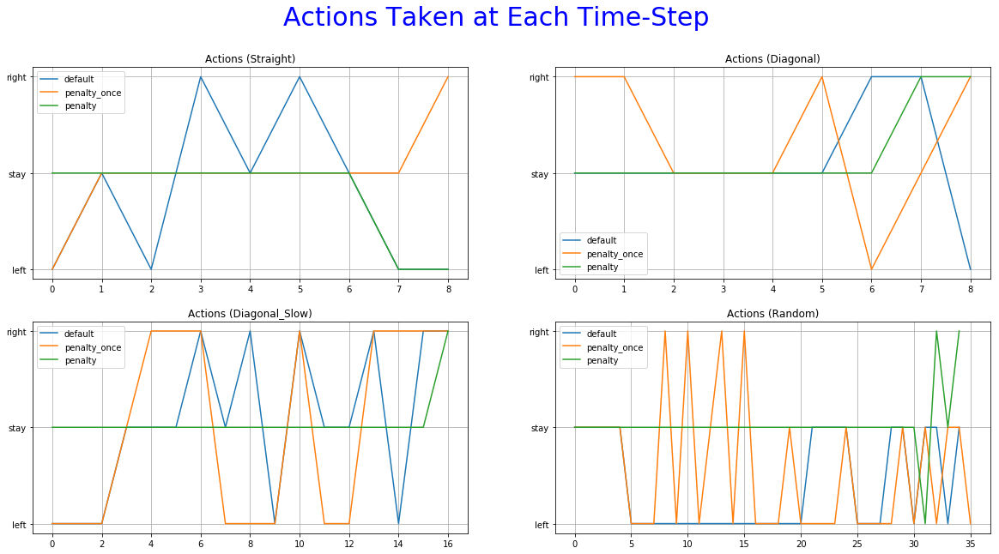

In [13]:
presentation.plot_actions_mod(test_results)

# Policy Comparison Animations
The 4 animations below display a comparison of the agents with different policies. These animations can offer a better understanding of the agents and their approach to winning in the game. After each episode, some useful statistics are displayed.

In [14]:
HTML(video_dict['straight'])

In [15]:
HTML(video_dict['diagonal'])

In [ ]:
HTML(video_dict['diagonal_slow'])

In [ ]:
HTML(video_dict['random'])

## Conclusion

As it was expected by the initial hypothesis, a reward function that penalizes extra moves results to a decrease of the undesirable behaviors while maintaining almost the same win rate. 

#### I. Default Reward Function
The greater freedom of actions allowed to our agent by the default reward function helped him perform well in all of the experiments. It even accomplishes better scores in the stochastic game mode (random) and also a smaller number of extra moves in some of the cases. This was unexpected and it raises some question as of the utility of the Penalized Once function.

#### II. Penalized Once Reward Function
The reward function with penalization only once yields performances closer to the Default function. It managed to achieve good scores, outperforming the other two in some cases. despite that, we cannot see a decrease in the occurrence of extra moves. The improvement is not significant or as consistent as it is this the immediate penalization function. This can be further confirmed by looking at the "Actions Taken Frequency" graphs where it performs almost the same actions as the default function. A possible explanation might be that the agent didn't make the correct correlation between extra moves and lower reward functions. Using a smaller decay rate to the exploration parameter and/or more training time might help in this direction.

#### III. Penalized Reward Function
More specifically, the reward function with immediate penalization of extra moves was able to reduce the occurrence of unwanted behaviors drastically, leading to an agent that chooses to "stay" a lot more times than its competitors. Moreover, it accomplishes similar win rates with the default reward function. However, this success does not extend to the Non-deterministic game mode where the win rate dropped to 62%.
From the 6th set of graphs of each group, it becomes apparent that the way we constructed the reward values led to a policy that avoids moves especially in the first steps of the episode because they accumulate negatives rewards. Although it makes sense for the agent to act more boldly, neglecting negative rewards towards the end of the episode where the rewards values of the next stages increase dew to the possibility of getting the "win" reward, we might prefer for him to act "proactively" as this might ensure greater success rates. A reward function that encourages moves in the early stages of an episode has to be evaluated in the future. A weight that increases with time and is multiplied with the penalty <b>p</b> could be beneficial to achieve this.


### Closing Thoughts

Overall, we have shown how changing the reward function of an RL agent can influence its policy and in turn its behaviors. By doing so we can "nudge" the agent into performing in accordance with the needs of the task. Of course, creating a good reward function is a craft, a process that we must approach carefully in order to maintain a balance between giving to the agent enough freedom of actions and correcting undesirable behaviors.


### Future Work

The previous observations along with the arguments Sutton puts forward in his recent article ["The Bitter Lesson"](http://incompleteideas.net/IncIdeas/BitterLesson.html) can give rise to a new set of experiments trying to investigate if the reward function with the fewest restrictions and "hardcoded" intuitions can overpower the other two given the right amount of training time. 

Other ways that we can continue this work in the future, apart from applying the insights gathered by this experiment, include adding Convolutional layers to the network, limiting the size of the environment visible to the agent, mixing the game modes during training, apply SOTA algorithms, etc.

